In [2]:
suppressMessages(library(ArchR))
suppressMessages(library(Seurat))
suppressMessages(library(Signac))
suppressMessages(library(harmony))
suppressMessages(library(dplyr))
suppressMessages(library(cowplot))
suppressMessages(library(harmony))
suppressMessages(library(Nebulosa))
suppressMessages(library(ggpubr))
suppressMessages(library(Ipaper))
suppressMessages(library(viridis))
suppressMessages(library(phateR))
suppressMessages(library(igraph))
suppressMessages(library(ggraph))
suppressMessages(library(tidygraph))
suppressMessages(library(patchwork))

In [1]:
getwd()

[1] "/data/scATA/SingleCellOpenChromatin/local/VisiumHeartRevision/Figures/Main/Fig4"

In [3]:
coembed <- readRDS("../../../IntegrativeAnalysis/Cardiomyocyte/data/coembed/coembed.annotation.Rds")
coembed

An object of class Seurat 
230075 features across 59045 samples within 3 assays 
Active assay: RNA (28933 features, 2000 variable features)
 2 other assays present: peaks, GeneActivity
 5 dimensional reductions calculated: pca, umap, harmony, umap_harmony, umap_harmony_v2

In [6]:
df_count <- coembed@meta.data %>%
    as.data.frame() %>%
    group_by(annotation, tech) %>%
    summarise(count = n())

df_count

write.csv(df_count, "df_count.csv")

`summarise()` has grouped output by 'annotation'. You can override using the
`.groups` argument.


annotation,tech,count
<fct>,<chr>,<int>
healthy_CM,ATAC,8719
healthy_CM,RNA,20131
intermediate_CM,ATAC,5052
intermediate_CM,RNA,13132
damaged_CM,ATAC,989
damaged_CM,RNA,7181
vCM_3,ATAC,620
vCM_3,RNA,1589
vCM_4,ATAC,339


In [4]:
cols <- ArchR::paletteDiscrete(unique(coembed$annotation))
cols

healthy_CM intermediate_CM      damaged_CM           vCM_3           vCM_4 
      "#D51F26"       "#272E6A"       "#208A42"       "#89288F"       "#F47D2B"

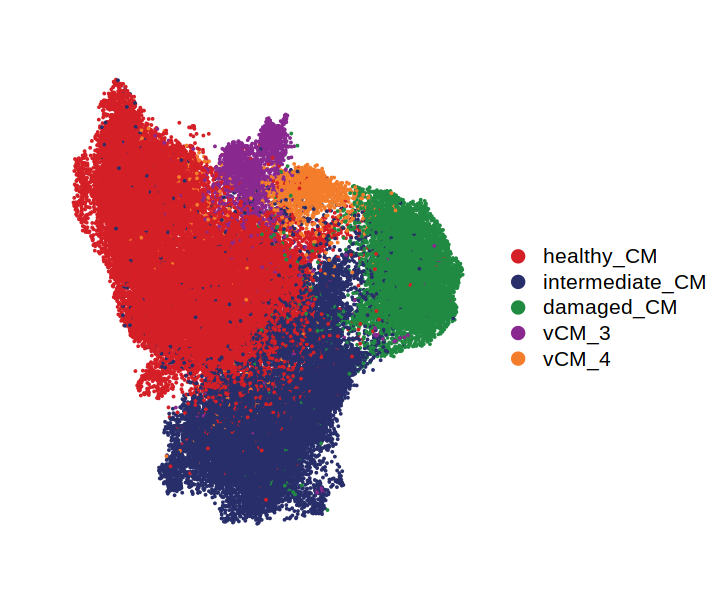

In [5]:
p <- DimPlot(coembed, reduction = "umap_harmony_v2", group.by = "annotation",
            cols = cols) +
    xlab("") + ylab("") + ggtitle("") +
    theme(axis.line = element_blank(),
         axis.ticks = element_blank(),
         axis.text = element_blank())

options(repr.plot.height = 5, repr.plot.width = 6)

print(p)

ggsave("umap_sub_clusters.pdf", plot = p, height = 5, width = 6)

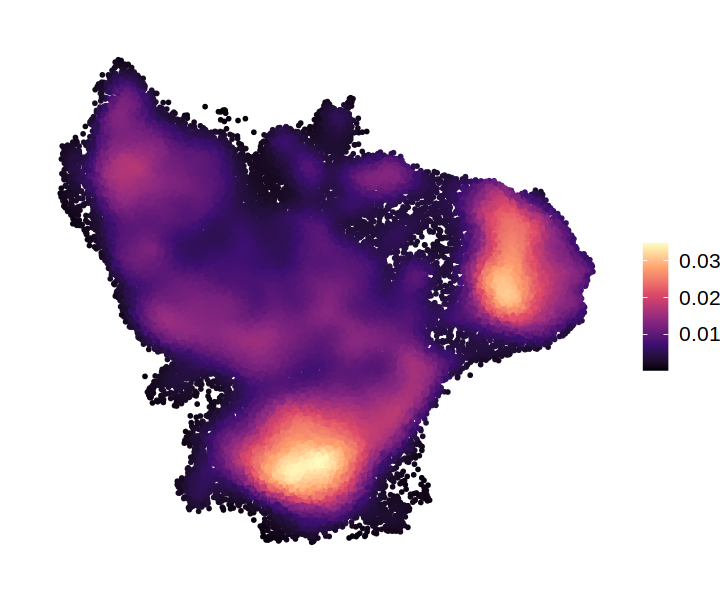

[[1]]
marker_ANKRD1.pdf

[[2]]
marker_NPPB.pdf

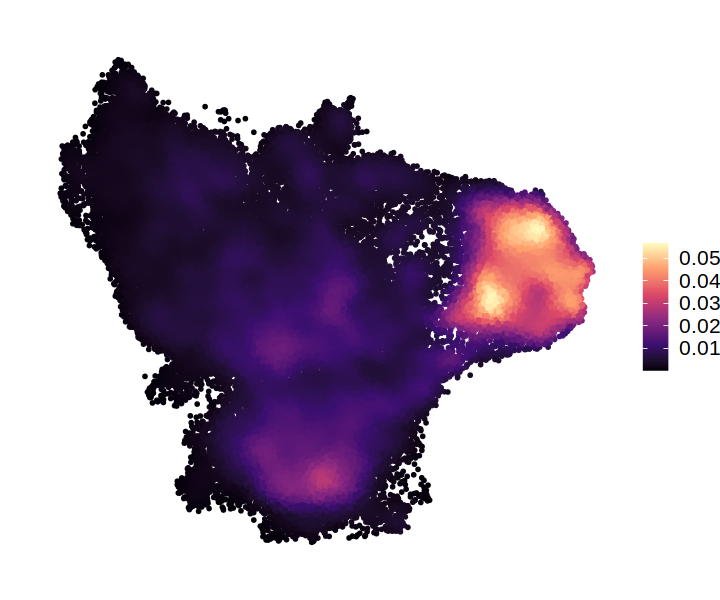

In [6]:
gene.list <- c("ANKRD1", "NPPB")

lapply(gene.list, function(gene){
    p <- plot_density(coembed, features = gene, reduction = "umap_harmony_v2",
                     pal = "magma") +
        xlab("") + ylab("") + ggtitle("") +
    theme_cowplot() +
    theme(axis.line = element_blank(),
         axis.ticks = element_blank(),
         axis.text = element_blank(),
         legend.title = element_blank(),
         plot.margin = unit(c(0, 0, 0, 0), "cm"))
    
    print(p)
    
    ggsave(glue::glue("marker_{gene}.pdf"), plot = p, height = 4, width = 4)
    
})

In [72]:
## we here update the annotaiton of samples
meta.data <- as.data.frame(coembed@meta.data) %>%
    rename(sample_id = orig.ident) %>%
    select(c(sample_id, annotation))

df_atac_anno <- read.csv("../../../Annotations_figures/atac_patient_anns_revisions.csv")
df_rna_anno <- read.csv("../../../Annotations_figures/rna_patient_anns_revisions.csv")

df_anno <- rbind(df_atac_anno, df_rna_anno) %>%
    select(c(sample_id, patient, patient_region_id, patient_group)) %>%
    subset(sample_id %in% meta.data$sample_id)

meta.data <- meta.data %>%
    dplyr::full_join(df_anno, by = "sample_id")

`summarise()` has grouped output by 'patient_region_id'. You can override using
the `.groups` argument.


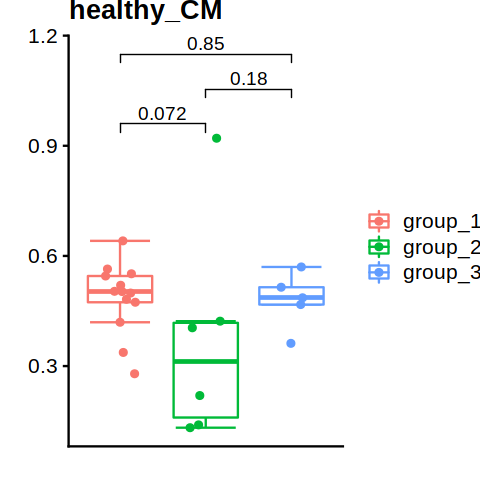

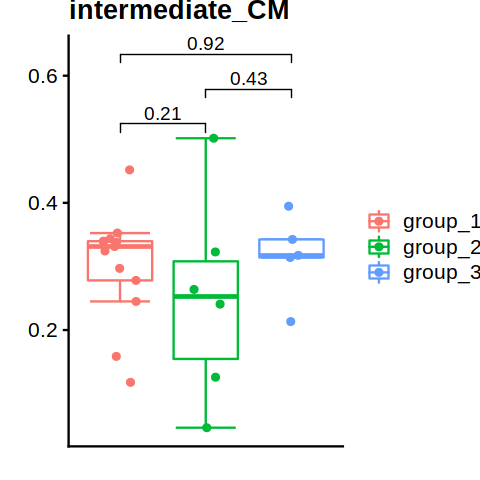

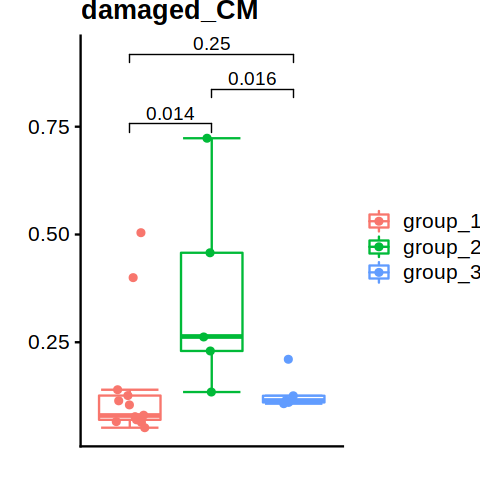

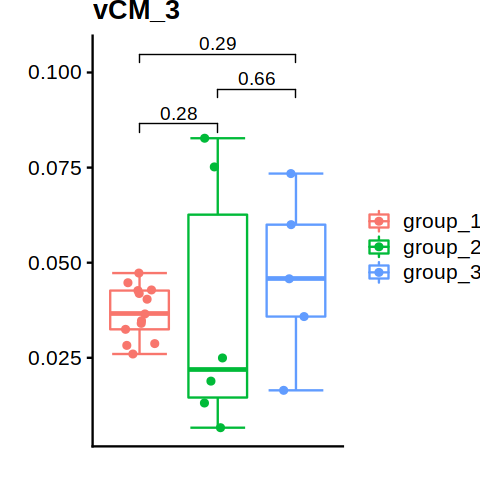

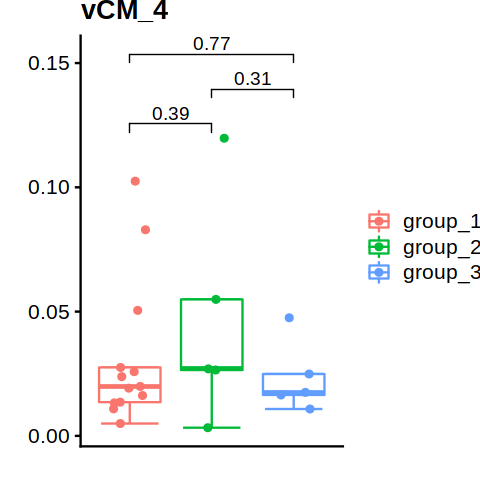

In [73]:
df_plot <- meta.data %>%
    group_by(patient_region_id, annotation) %>%
    summarise(counts = n()) %>%
    mutate(proportion = counts / sum(counts))

df_anno <- meta.data %>%
    subset(., select = c("patient_region_id", "patient_group")) %>%
    unique()

df_plot <- merge.data.frame(df_plot, df_anno)

options(repr.plot.width = 4, repr.plot.height = 4)

for(anno in unique(df_plot$annotation)){
    p <- df_plot %>%
        subset(annotation == anno) %>%
        ggplot(aes(x = patient_group, y = proportion)) +
        geom_boxplot2(aes(color = patient_group)) +
        geom_point(aes(color = patient_group), position = position_jitterdodge(), size = 1.5) +
        stat_compare_means(comparisons = list(c("group_1", "group_2"),
                                             c("group_2", "group_3"),
                                             c("group_1", "group_3")),
                       method = "wilcox.test"
                          #label.y = c(0.6, 0.65, 0.7),
                          ) +
        ggtitle(anno) +
        theme_cowplot() +
        #ylim(0, 0.75) +
        xlab("") + ylab("") +
        theme(axis.text.x = element_blank(),
             legend.title = element_blank(),
             axis.ticks.x = element_blank(),
             plot.margin = unit(c(0, 0, 0, 0), "cm")
             )
    
    print(p)
    
    ggsave(glue::glue("{anno}_with_p_value.pdf"), plot = p, height = 4, width = 4)

}

In [8]:
patient_to_region<- c("control_P17" = "control",  # control
          "control_P1" = "control", # control
          "control_P7" = "control", # control
          "control_P8" = "control", # control
          "FZ_P14" = "FZ", # FZ
          "FZ_P18" = "FZ", # FZ
          "FZ_P20" = "FZ", # FZ
          "FZ/GT_P19" = "FZ", # FZ
          "FZ/GT_P4" = "FZ", # FZ
          "GT/IZ_P13" = "IZ", # IZ
          "GT/IZ_P15" = "IZ", # IZ
          "GT/IZ_P9_rep2" = "IZ", # IZ
          "GT/IZ_P9" = "IZ", # IZ
          "IZ_P10" = "IZ", # IZ
          "IZ_P15" = "IZ", # IZ
          "IZ_P16" = "IZ", # IZ
          "IZ_P3" = "IZ", # IZ
          "IZ/BZ_P2" = "IZ", # IZ
          "RZ_P11" = "RZ", # RZ
          "RZ_P3" = "RZ", # RZ
          "RZ_P6" = "RZ", # RZ
          "RZ_P9" = "RZ", # RZ
          "RZ/BZ_P12" = "BZ", # BZ
          "RZ/BZ_P2" = "BZ", # BZ
          "RZ/BZ_P3" = "BZ", # BZ
          "RZ/FZ_P5" = "FZ", # FZ
          "RZ/GT_P2" = "RZ" # RZ
        )

meta.data$region2 <- stringr::str_replace_all(meta.data$patient_region_id, patient_to_region)

`summarise()` has grouped output by 'patient_region_id'. You can override using the `.groups` argument.



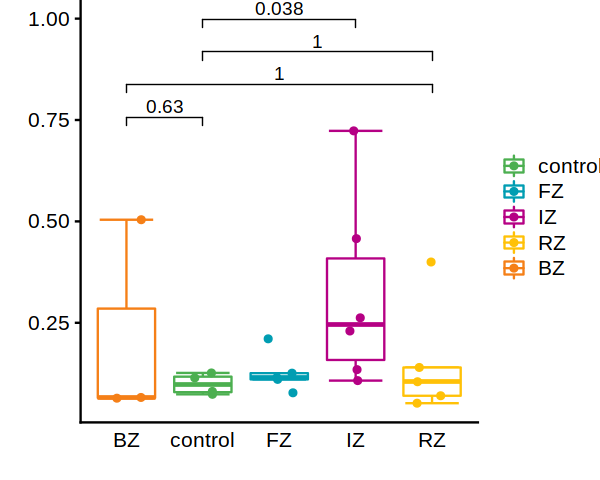

In [9]:
cols.region <- c("control" = "#4CAF50",  # control
          "FZ" = "#009DB2", # FZ
          "IZ" = "#B50084", # IZ
          "RZ" = "#FFC107", # RZ
          "BZ" = "#F57F17" # BZ
        )

df_plot <- meta.data %>% 
            group_by(patient_region_id, annotation) %>%
            summarise(counts = n()) %>%
            mutate(proportion = counts / sum(counts)) %>%
            subset(annotation == "damaged_CM")


df_anno <- meta.data %>%
    subset(., select = c("patient_region_id", "region2")) %>%
    unique()

df_plot <- merge.data.frame(df_plot, df_anno)

p <- ggplot(data = df_plot, aes(x = region2, y = proportion)) +
    geom_boxplot2(aes(color = region2)) +
    geom_point(aes(color = region2), 
               position = position_jitterdodge(), size = 1.5) +
    scale_color_manual(values = cols.region) +
    stat_compare_means(comparisons = list(c("BZ", "control"),
                                         c("BZ", "RZ"),
                                         c("RZ", "control"),
                                         c("IZ", "control")),
                   method = "wilcox.test") +
    theme_cowplot() +
    xlab("") + ylab("") +
    theme(#axis.text.x = element_blank(),
         legend.title = element_blank(),
         axis.ticks.x = element_blank(),
         plot.margin = unit(c(0, 0, 0, 0), "cm")
         )

options(repr.plot.height = 4, repr.plot.width = 5)

p

ggsave("cell_proportion_failing_CM_five_groups.pdf", height = 4, width = 5, plot = p)

In [ ]:
df_plot <- meta.data %>% 
            group_by(patient_region_id, annotation) %>%
            summarise(counts = n()) %>%
            mutate(proportion = counts / sum(counts)) %>%
            subset(annotation == "damaged_CM")


df_anno <- meta.data %>%
    subset(., select = c("patient_region_id", "region2")) %>%
    unique()

df_plot <- merge.data.frame(df_plot, df_anno)

p <- ggplot(data = df_plot, aes(x = region2, y = proportion)) +
    geom_boxplot2(aes(color = region2)) +
    geom_point(aes(color = region2), 
               position = position_jitterdodge(), size = 1.5) +
    scale_color_manual(values = cols.region) +
    stat_compare_means(comparisons = list(c("BZ", "control"),
                                         c("BZ", "RZ"),
                                         c("RZ", "control"),
                                         c("IZ", "control")),
                   method = "wilcox.test") +
    theme_cowplot() +
    xlab("") + ylab("") +
    theme(#axis.text.x = element_blank(),
         legend.title = element_blank(),
         axis.ticks.x = element_blank(),
         plot.margin = unit(c(0, 0, 0, 0), "cm")
         )

options(repr.plot.height = 4, repr.plot.width = 5)

p

ggsave("cell_proportion_failing_CM_five_groups.pdf", height = 4, width = 5, plot = p)

In [10]:
# library(rstatix)

# stat.test <- df_plot %>%
#   group_by(annotation) %>%
#   wilcox_test(proportion ~ patient_group, p.adjust.method = "fdr", exact = TRUE,
#              comparisons = list(c("Myogenic", "Ischemic"), 
#                                 c("Myogenic", "Fibrotic")))

# stat.test

In [2]:
## 
obj.visium <- readRDS("../../../IntegrativeAnalysis/Cardiomyocyte/data/visium/objects/AKK002_157781_RZ_BZ_P3.Rds")

In [7]:
obj.visium

An object of class Seurat 
33510 features across 4659 samples within 7 assays 
Active assay: SCT (16552 features, 3000 variable features)
 6 other assays present: Spatial, dorothea, progeny, c2l, c2l_props, cell_states
 2 dimensional reductions calculated: pca, umap

In [12]:
# p1 <- SpatialFeaturePlot(obj.visium, features = "healthy_CM",
#                    min.cutoff = "q5", max.cutoff = "q95") +
# scale_fill_viridis() +
#     theme(legend.title = element_blank(),
#          plot.margin = unit(c(0, 0, 0, 0), "cm"))

# p2 <- SpatialFeaturePlot(obj.visium, features = "intermediate_CM",
#                    min.cutoff = "q5", max.cutoff = "q95") +
# scale_fill_viridis()+
#     theme(legend.title = element_blank(),
#          plot.margin = unit(c(0, 0, 0, 0), "cm"))

# p3 <- SpatialFeaturePlot(obj.visium, features = "damaged_CM",
#                    min.cutoff = "q5", max.cutoff = "q95") +
# scale_fill_viridis()+
#     theme(legend.title = element_blank(),
#          plot.margin = unit(c(0, 0, 0, 0), "cm"))

# p1
# p2
# p3

# ggsave("AKK002_157781_RZ_BZ_P3_healthy_CM.pdf", plot = p1, height = 5, width = 5)
# ggsave("AKK002_157781_RZ_BZ_P3_intermediate_CM.pdf", plot = p2, height = 5, width = 5)
# ggsave("AKK002_157781_RZ_BZ_P3_damaged_CM.pdf", plot = p3, height = 5, width = 5)

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



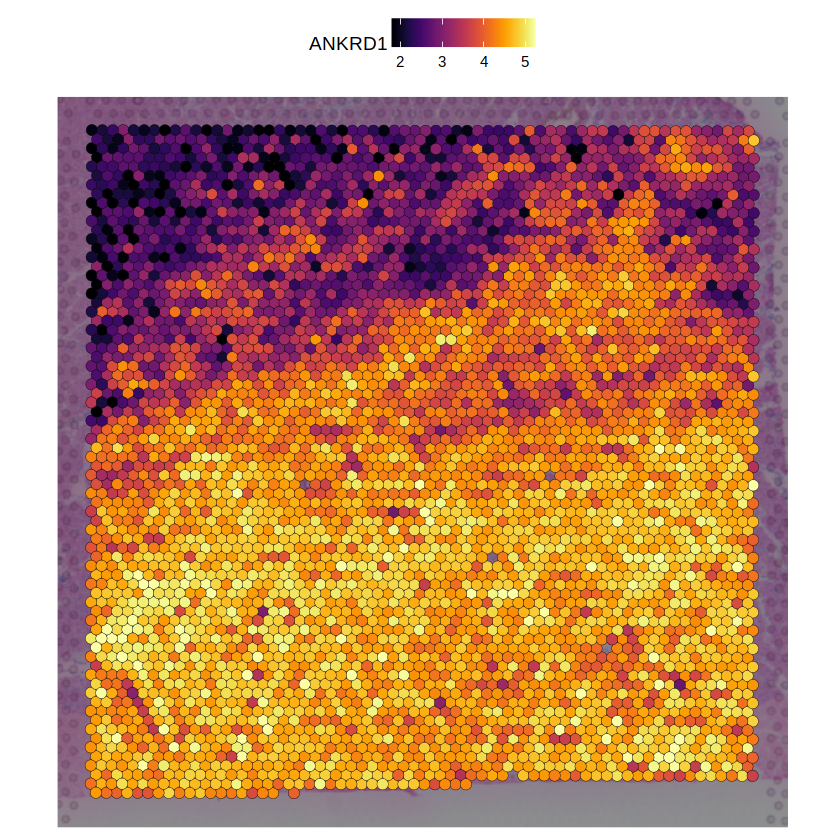

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



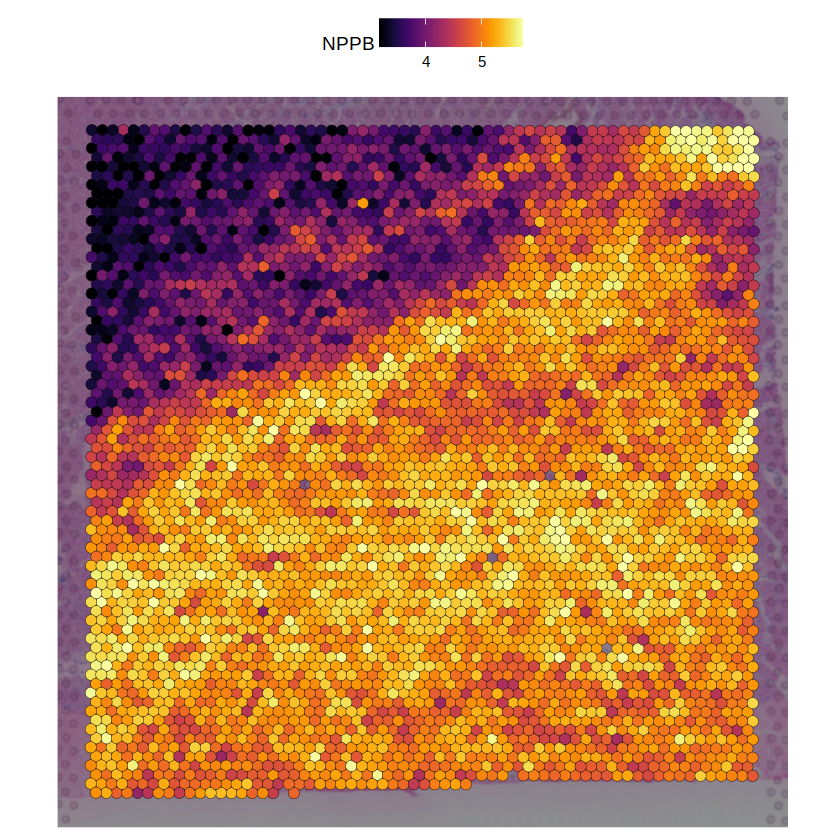

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



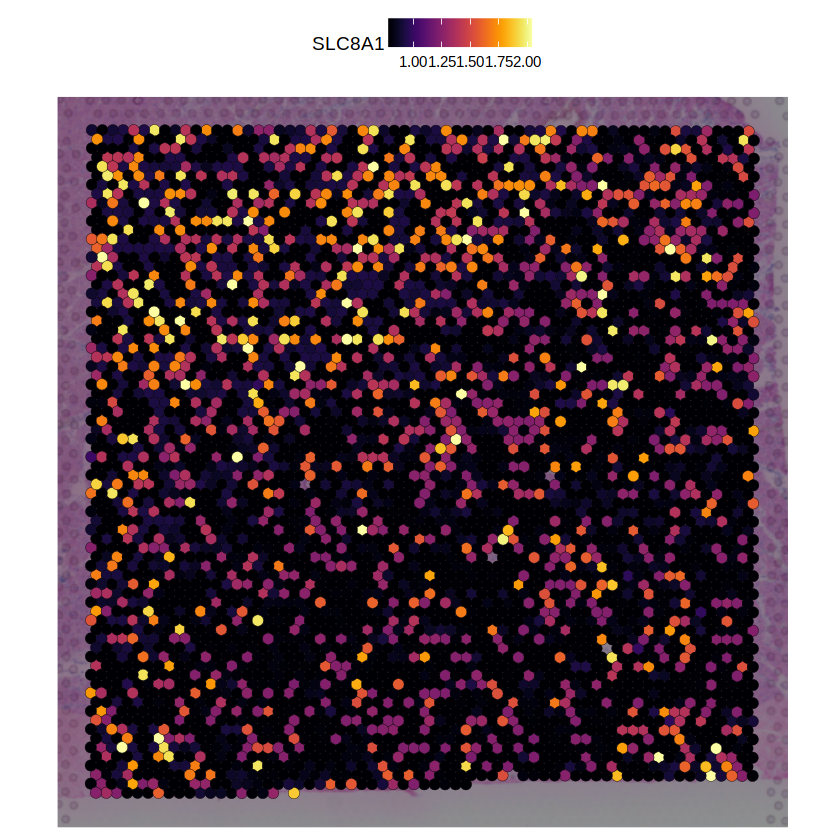

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



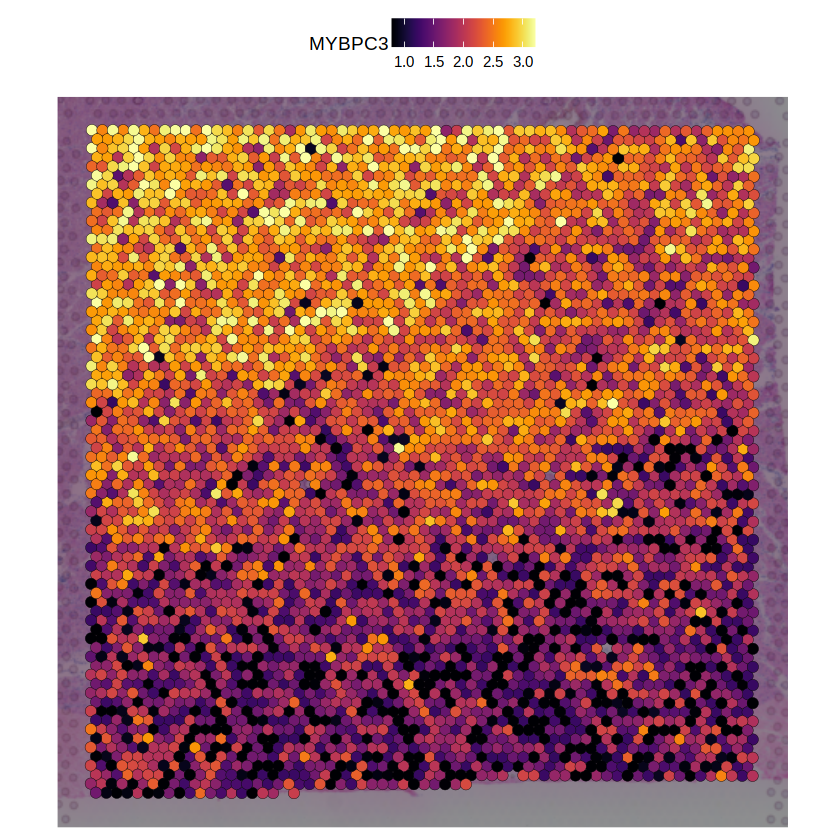

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



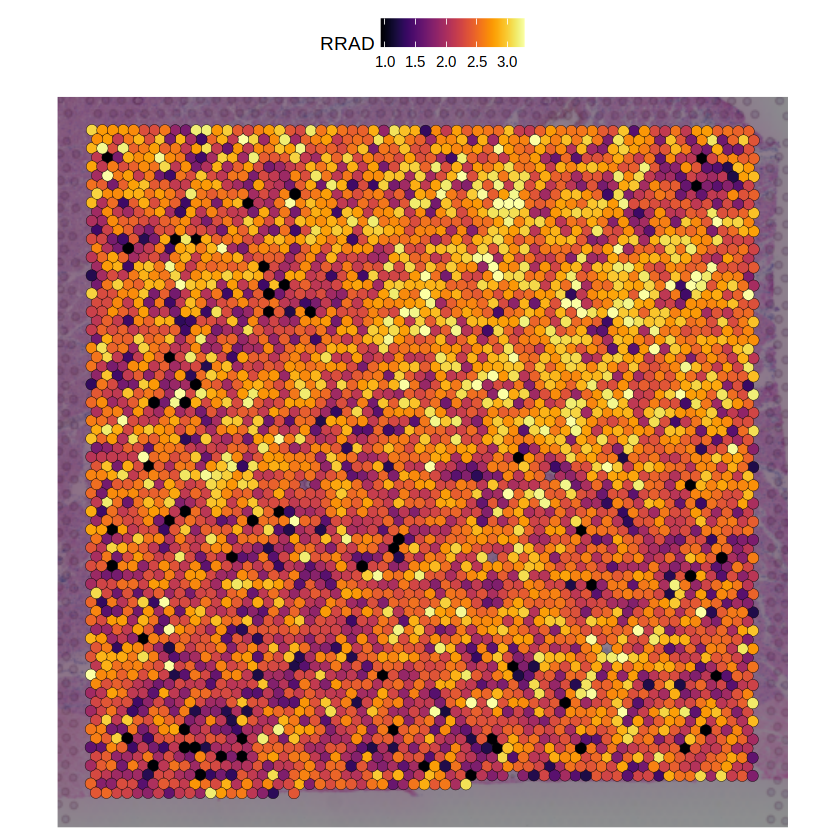

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



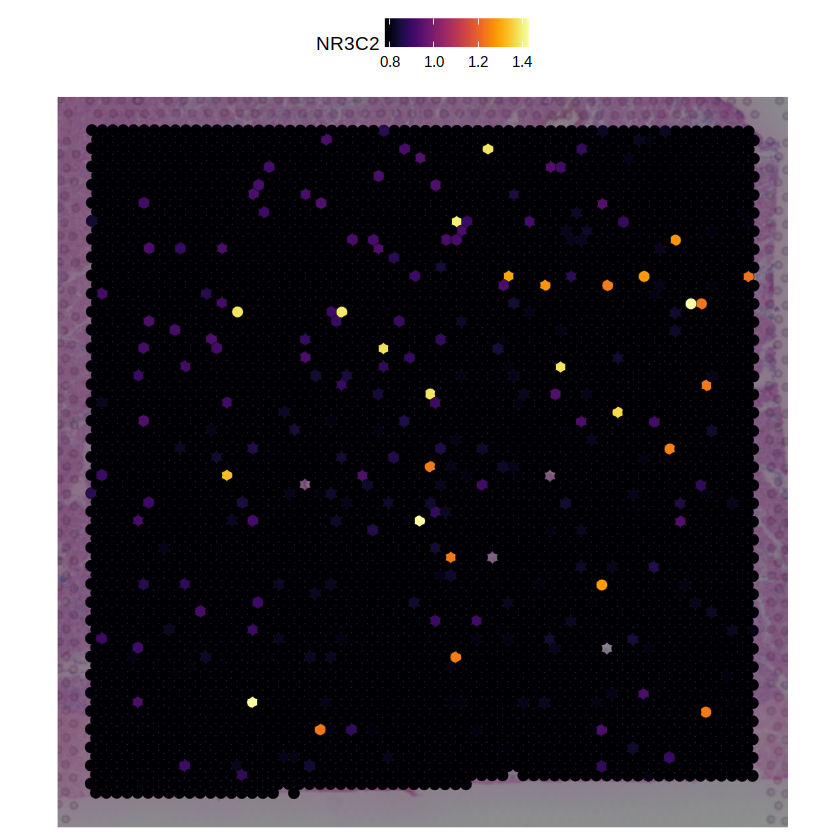

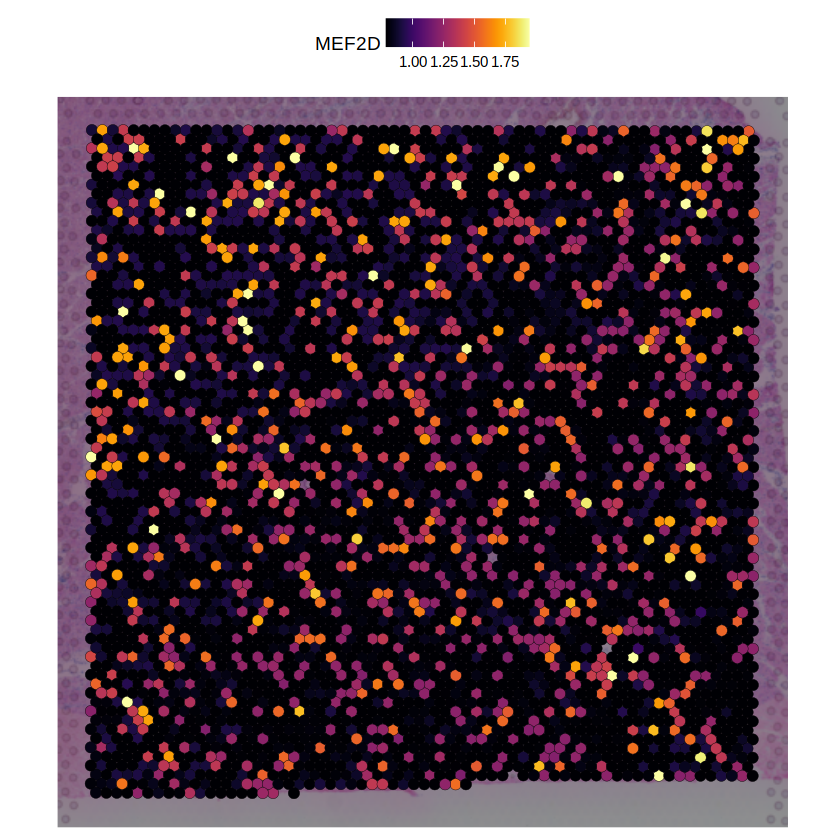

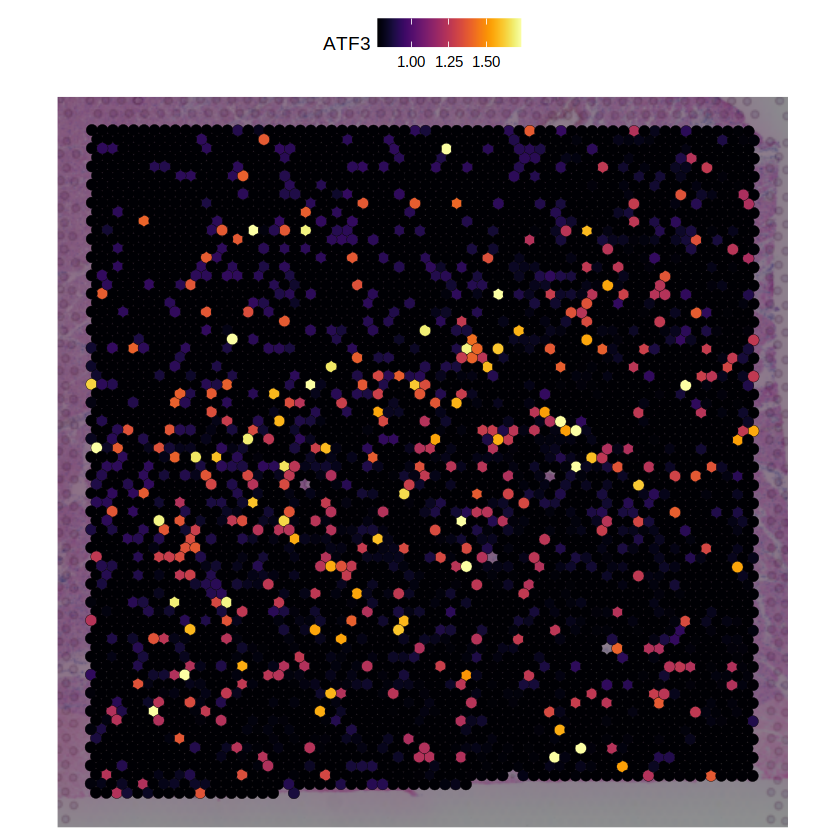

In [12]:
DefaultAssay(obj.visium) <- "SCT"

for(gene in c("ANKRD1", "NPPB", "SLC8A1", "MYBPC3", "RRAD",
             "NR3C2", "MEF2D", "ATF3")){
    p <- SpatialFeaturePlot(obj.visium, features = gene,
                   min.cutoff = "q1", max.cutoff = "q99") +
    scale_fill_viridis(option = "B") +
    theme(#legend.title = element_blank(),
         plot.margin = unit(c(0, 0, 0, 0), "cm"))
    
    print(p)
    
    ggsave(glue::glue("AKK002_157781_RZ_BZ_P3_{gene}.pdf"),
          plot = p, height = 5, width = 5)


}

[1] "Androgen" "EGFR"     "Estrogen" "Hypoxia"  "JAK-STAT" "MAPK"    
 [7] "NFkB"     "p53"      "PI3K"     "TGFb"     "TNFa"     "Trail"   
[13] "VEGF"     "WNT"

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



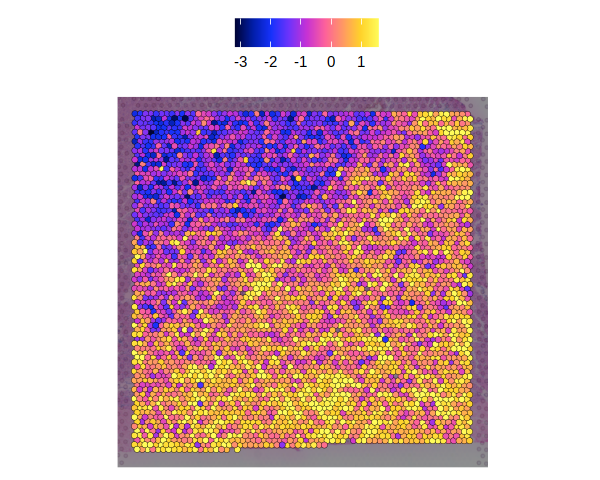

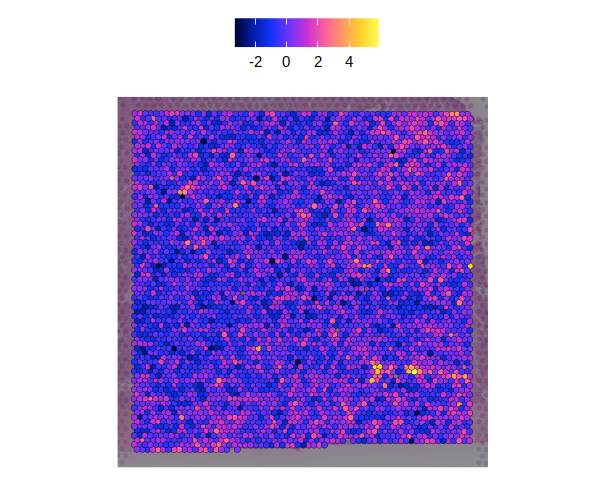

In [14]:
DefaultAssay(obj.visium) <- "progeny"

unique(rownames(obj.visium))

p1 <- SpatialFeaturePlot(obj.visium, features = "TGFb",
                         max.cutoff = "q90") +
scale_fill_gradientn(colors = ArchR::paletteContinuous("horizonExtra", n = 256)) +
    theme(legend.title = element_blank(),
         plot.margin = unit(c(0, 0, 0, 0), "cm"))

p2 <- SpatialFeaturePlot(obj.visium, features = "Hypoxia") +
scale_fill_gradientn(colors = ArchR::paletteContinuous("horizonExtra", n = 256)) +
    theme(legend.title = element_blank(),
         plot.margin = unit(c(0, 0, 0, 0), "cm"))

p1
p2

ggsave("AKK002_157781_RZ_BZ_P3_TGFb.pdf", plot = p1, height = 5, width = 5)
ggsave("AKK002_157781_RZ_BZ_P3_Hypoxia.pdf", plot = p2, height = 5, width = 5)

In [ ]:
## plot GRN
df <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/gene_regulatory_network.csv")

head(df)

In [2]:
## plot GRN
df <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/gene_regulatory_network.csv")

head(df)

tf.list <- unique(df$tf)
gene.list <- setdiff(unique(df$gene), tf.list)


df_measure <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/netmeasures_final_cms.csv",
                      row.names = 1) %>%
    subset(., type == "TF/Gene") %>%
    select(c(name, page, bet)) %>%
    mutate(page_scale = scale(page)[, 1]) %>%
    mutate(bet_scale = scale(bet)[, 1]) %>%
    rename(tf = name)

## compute importance only for TFs based on centrality and betweenness
min.page <- min(df_measure$page_scale)
min.bet <- min(df_measure$bet_scale)
df_measure$importance <- sqrt((df_measure$page_scale - min.page)**2 + 
                             (df_measure$bet_scale - min.bet)**2)
df_measure <- df_measure[order(-df_measure$importance), ]
rownames(df_measure) <- df_measure$tf


## load clustering results for genes and pseudotime point for TFs
df_gene_clustering <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/gene_cluster.csv",
                         row.names = 1) %>%
    subset(gene %in% gene.list)

df_timepoint <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/time_point.csv",
                        row.names = 1) %>%
    subset(tf %in% tf.list)

# create graph from data frame
g <- graph_from_data_frame(df, directed=TRUE)

In [3]:
# assign size to each node
## for TFs, the size is proportional to the importance
tf_size <- df_measure$importance

## for genes, we use the minimum size of TFs
gene_size <- rep(min(df_measure$importance), length(gene.list))

names(tf_size) <- df_measure$tf
names(gene_size) <- gene.list

v_size <- c(tf_size, gene_size)

# add size
V(g)$size <- v_size[V(g)$name]

# assign color to each node
## TFs are colored by pseudotime point
df_timepoint <- df_timepoint[order(df_timepoint$time_point), ]

tf_color <- ArchR::paletteContinuous(set = "blueYellow", 
                                     n = nrow(df_timepoint))
names(tf_color) <- df_timepoint$tf

## genes are colored based on the clustering
gene_color <- stringr::str_replace_all(df_gene_clustering$cluster,
                                      c("healthy_CM" = "#D51F26",
                                       "damaged_CM" = "#208A42",
                                       "intermediate_CM" = "#272E6A"))

names(gene_color) <- df_gene_clustering$gene

v_color <- c(tf_color, gene_color)

In [4]:
## assign alpha
tf_alpha <- rep(1, length(tf.list))
gene_alpha <- rep(0.5, length(gene.list))

names(tf_alpha) <- tf.list
names(gene_alpha) <- gene.list

v_alpha <- c(tf.list, gene.list)

V(g)$alpha <- v_alpha[V(g)$name]

# compute layout
set.seed(42)
layout <- layout_with_fr(g, weights = E(g)$correlation, dim = 2, niter = 1000)

Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“ggrepel: 13 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


png 
  2

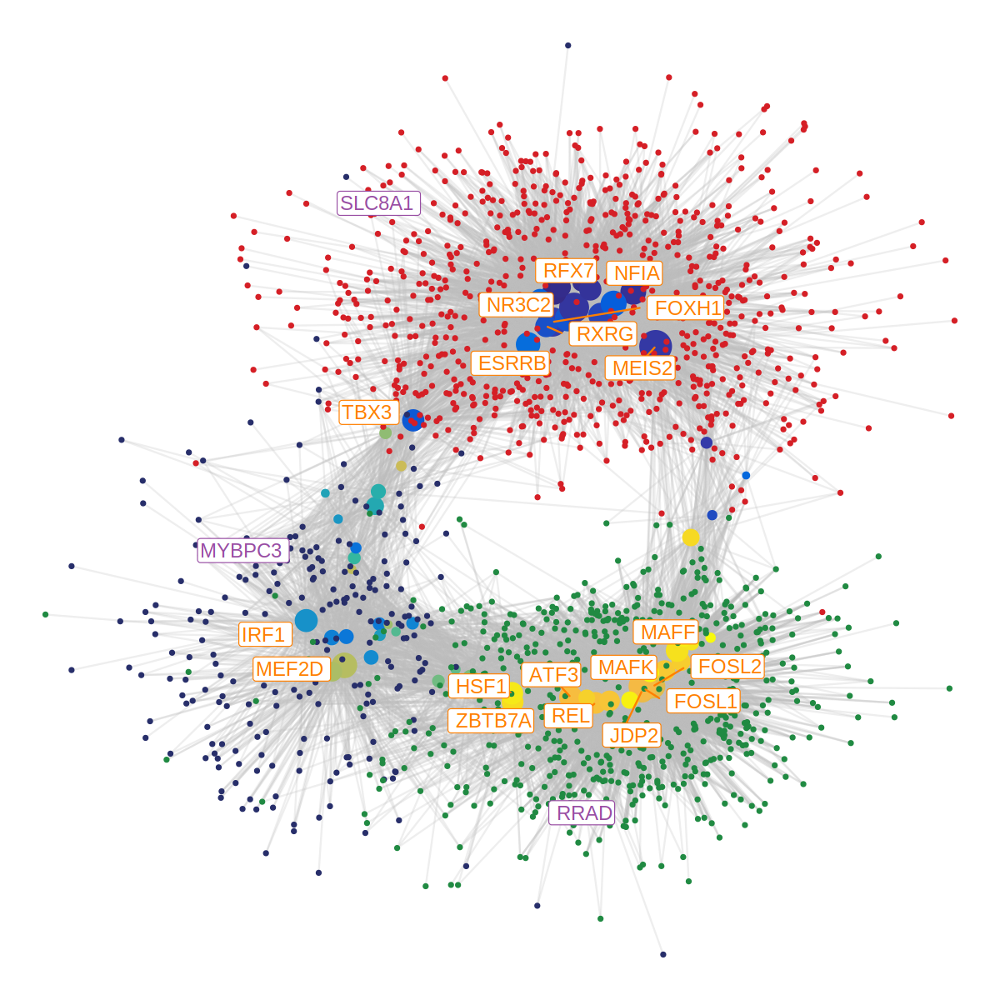

In [6]:
options(repr.plot.height = 10, repr.plot.width = 10)

df_measure_sub <- subset(df_measure, importance > 2)

p <- ggraph(g, layout = layout) +
geom_edge_link(edge_colour = "gray", edge_alpha = 0.25) +
geom_node_point(aes(size = V(g)$size,
                   color = as.factor(name),
                   alpha = V(g)$alpha,
                   ),
                show.legend = FALSE) +
scale_size(range = c(1, 10)) +
scale_color_manual(values = v_color) +
geom_node_label(aes(filter = V(g)$name %in% df_measure_sub$tf,
                    label = V(g)$name),
                    repel = TRUE,
                    hjust = "inward",
                color = "#ff7f00",
                size = 5,
                show.legend = FALSE) +
geom_node_label(aes(filter = V(g)$name %in% c("SLC8A1", "MYBPC3", "RRAD") ,
                    label = V(g)$name),
                    repel = TRUE,
                    hjust = "inward",
                size = 5,
                color = "#984ea3",
                show.legend = FALSE) +
theme_void()


print(p)

pdf("gene_regulatory_network.pdf", height = 10, width = 10)
print(p)
dev.off()

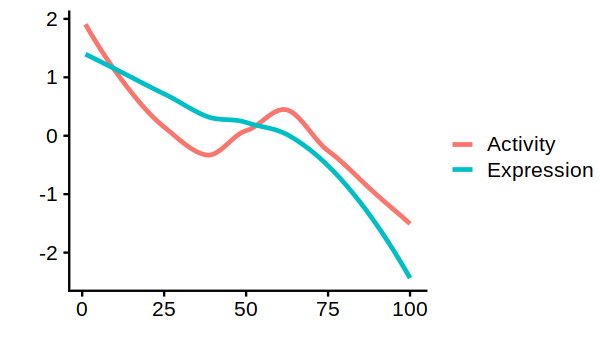

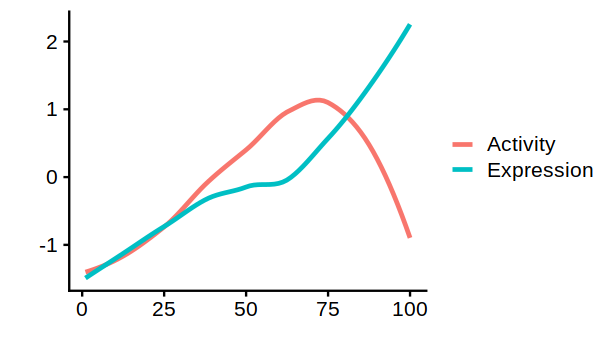

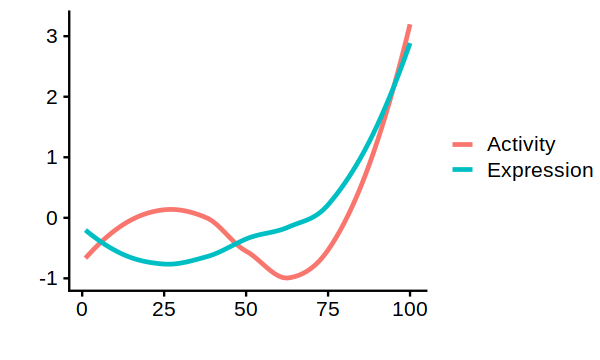

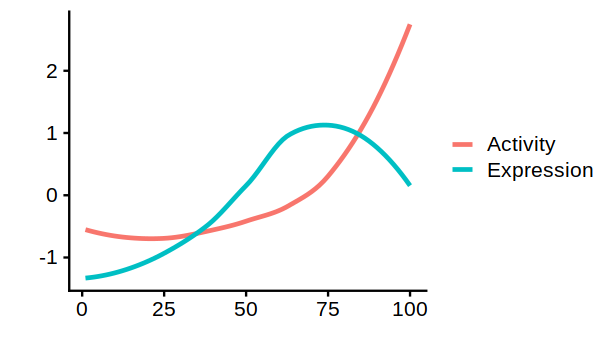

In [28]:
## plot NR3C2
df_activity <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/VisGRN_V2/TF_activity.csv")
df_expression <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/VisGRN_V2/TF_expression.csv")

options(repr.plot.height = 3, repr.plot.width = 5)

for(sel_tf in c("NR3C2", "MEF2D", "JDP2", "ATF3")){
        df_plot1 <- subset(df_activity, tf == sel_tf) %>%
            rename(value = tf_activity) %>%
            mutate(value = scale(value)) %>%
            mutate(data = "Activity")

        
        df_plot2 <- subset(df_expression, tf == sel_tf) %>%
            rename(value = tf_expression)%>%
            mutate(value = scale(value)) %>%
            mutate(data = "Expression")
        
        df_plot <- rbind(df_plot1, df_plot2)
        
        p <- ggplot(data = df_plot, aes(x = pseudotime, y = value, color = data)) +
        geom_smooth(formula = y ~ x, method = "loess",se = FALSE) +
        xlab("") + ylab("") +
        theme_cowplot() +
        theme(legend.title = element_blank())
    
        print(p)
    
    ggsave(glue::glue("{sel_tf}.pdf"), plot = p, height = 3, width = 5)
        
}

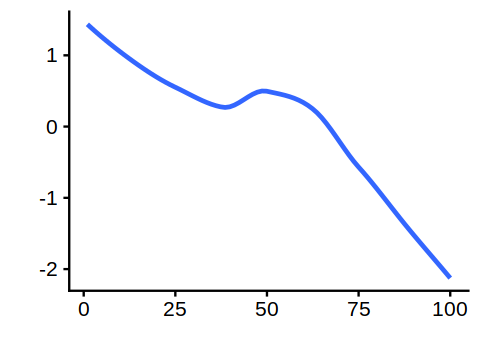

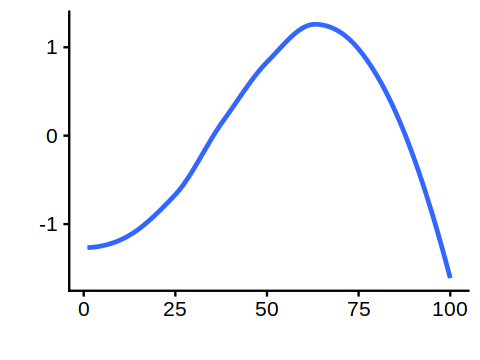

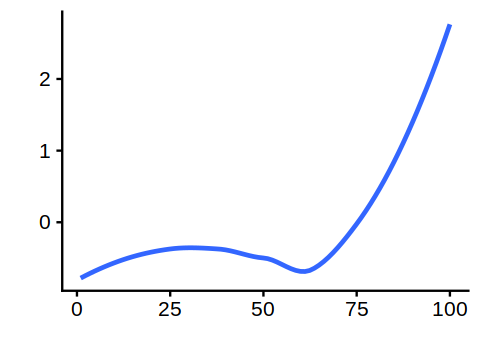

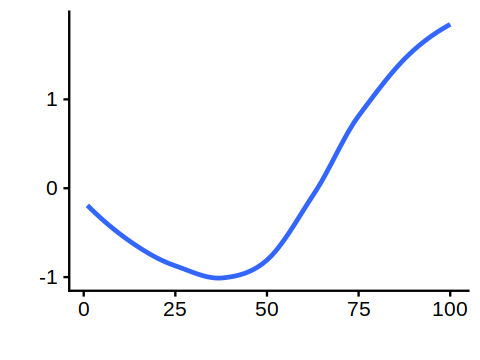

In [29]:
## target gene expression
df <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/VisGRN_V2/TF_Target_Gene_expression.csv",
              row.names = 1)

options(repr.plot.height = 3, repr.plot.width = 4)

for(sel_gene in c("SLC8A1", "MYBPC3", "TGFB2", "RRAD")){
    p <- df %>%
        subset(gene == sel_gene) %>%
        ggplot(aes(x = pseudotime, y = gene_expression)) +
        geom_smooth(formula = y ~ x, method = "loess",se = FALSE) +
        xlab("") + ylab("") +
        theme_cowplot() +
        theme(legend.title = element_blank())
    
    print(p)
    
    ggsave(glue::glue("{sel_gene}.pdf"), plot = p, height = 3, width = 4)

}

In [22]:
## plot target gene in spatial space
df_grn <- read.csv("../../../IntegrativeAnalysis/Cardiomyocyte/data/snATAC_healthy_intermediate_damaged/gene_regulatory_network.csv")
head(df_grn)

,tf,gene,correlation
,<chr>,<chr>,<dbl>
1,NFIA,TRDN,0.5352448
2,FOXH1,TRDN,0.7274919
3,HLF,TRDN,0.7511693
4,ESRRB,TRDN,0.5484806
5,RFX3,KCNMB2,0.8387288
6,NR3C2,SPHKAP,0.6645800


In [23]:
# load visium object
sample <- "AKK002_157781"

obj <- readRDS(glue::glue("../../../visiumSpatial/from_rico/processed_visium/objects/{sample}.rds"))  
DefaultAssay(obj) <- "Spatial"

Warning message:
“The following features are not present in the object: SYT2, LINC01237, LINC00571, KLHL7-DT, MEP1B, KCND3-IT1, GLIPR1L1, LRRTM3, LINC00964, TAS2R10, not searching for symbol synonyms”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
“The following features are not present in the object: LINC01135, FOXH1, CBS, TSACC, not searching for symbol synonyms”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
“The following features are not present in the object: ABALON, GJA9, NIPAL4, C4orf45, C17orf64, KCP, EFCAB5, LINC00486, DNAI1, not searching for symbol synonyms”
Warning message:
“`guides(<scale> = FALSE)` is de

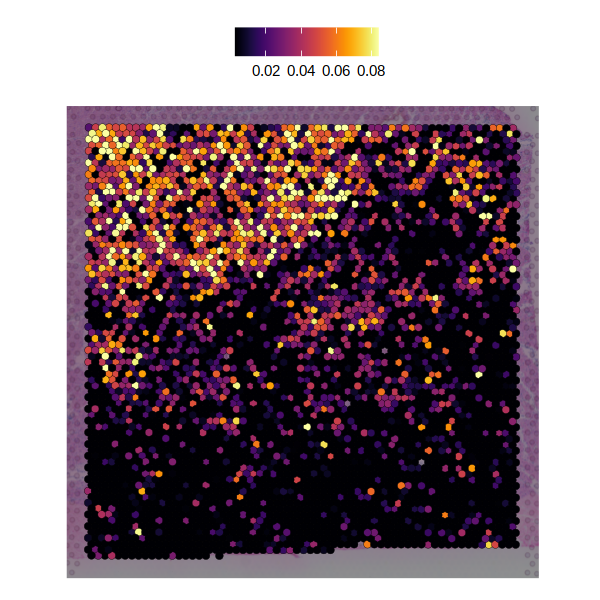

Warning message:
“The following features are not present in the object: ABALON, NIPAL4, C4orf45, EFCAB5, ATCAY, TSACC, not searching for symbol synonyms”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



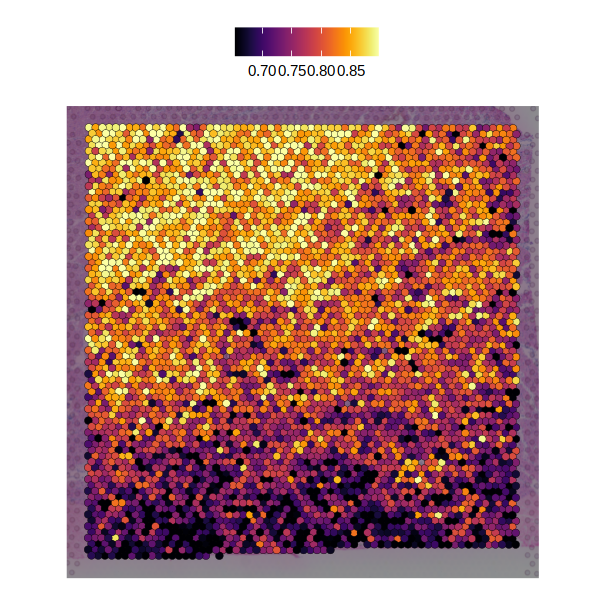

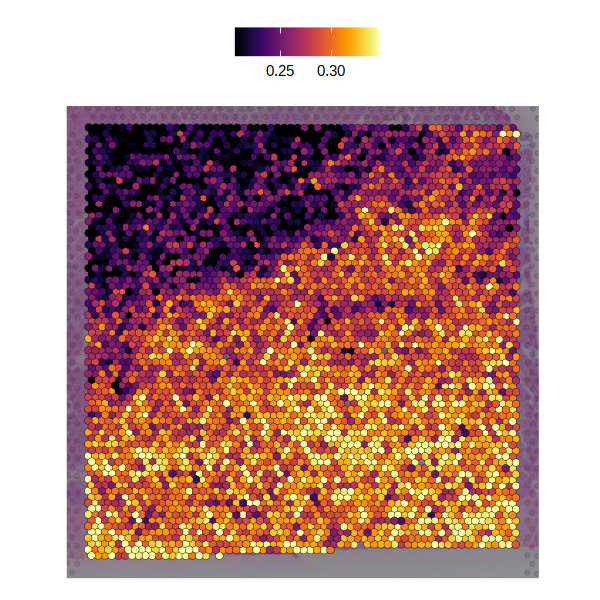

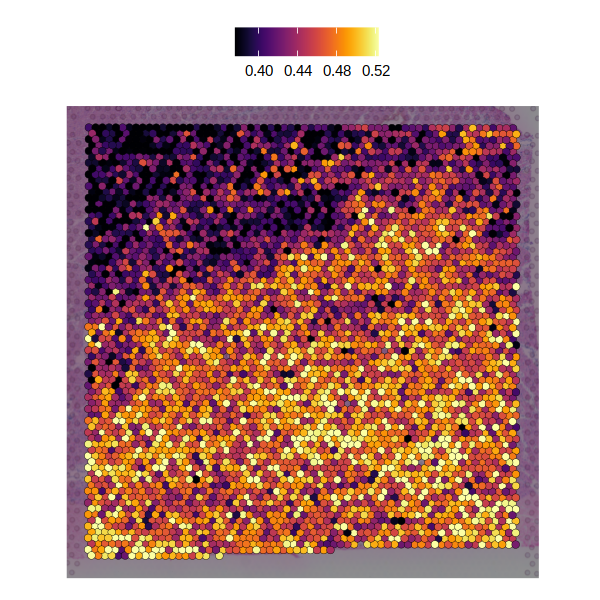

In [30]:
options(repr.plot.height = 5, repr.plot.width = 5)

for(sel_tf in c("NR3C2", "MEF2D", "JDP2", "ATF3")){
    df_sub <- subset(df_grn, tf == sel_tf)
    target_genes <- list(df_sub$gene)

    # get module score
    obj <- AddModuleScore(obj, features = target_genes, assay = "SCT")
    
    p <- SpatialFeaturePlot(obj, features = "Cluster1", min.cutoff = "q5",
                            max.cutoff = "q95") +
                    scale_fill_viridis(option = "B") +
    theme(legend.title = element_blank())
    
    print(p)
    
    ggsave(glue::glue("{sample}_{sel_tf}.pdf"), plot = p, height = 5, width = 5)

}

In [25]:
## plot misty results
suppressMessages(library(ComplexHeatmap))
suppressMessages(library(circlize))

df <- read.csv("./misty_stressedCMs/misty_model_imps_hmap_byg.csv")
head(df)

unique(df$view)

,view,Predictor,patient_group,mean_imp
,<chr>,<chr>,<chr>,<dbl>
1,colocalization,vSMCs,group_1,1.53667790
2,colocalization,vSMCs,group_2,0.79274833
3,colocalization,vSMCs,group_3,-0.42887875
4,colocalization,Fib,group_1,0.55396398
5,colocalization,Fib,group_2,-0.03744779
6,colocalization,Fib,group_3,0.89363403


[1] "colocalization"     "local neighborhood"

In [26]:
df1 <- subset(df, view == "colocalization") %>%
    select(-view) %>%
    tidyr::pivot_wider(names_from = Predictor, values_from = mean_imp) %>%
    textshape::column_to_rownames('patient_group')

df2 <- subset(df, view == "local neighborhood") %>%
    select(-view) %>%
    tidyr::pivot_wider(names_from = Predictor, values_from = mean_imp) %>%
    textshape::column_to_rownames('patient_group')

Warning message:
“Heatmap/annotation names are duplicated: Importance”
Warning message:
“Heatmap/annotation names are duplicated: Importance”


png 
  2

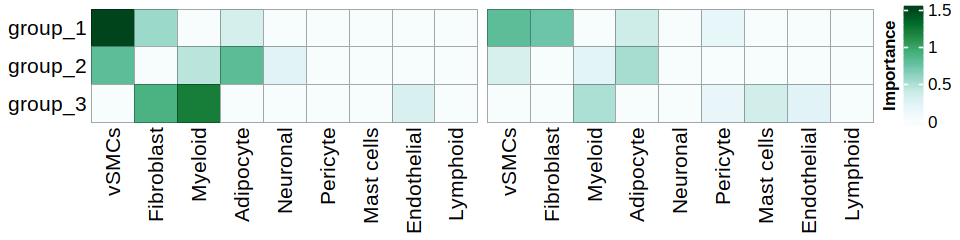

In [27]:
col_fun1 <- colorRamp2(seq(from = 0, to = 1.5, length = 9), 
                     RColorBrewer::brewer.pal(name = "BuGn", n = 9))

colnames(df1) <- c("vSMCs", "Fibroblast", "Myeloid", "Adipocyte",
                  "Neuronal", "Pericyte", "Mast cells", "Endothelial",
                  "Lymphoid")

colnames(df2) <- c("vSMCs", "Fibroblast", "Myeloid", "Adipocyte",
                  "Neuronal", "Pericyte", "Mast cells", "Endothelial",
                  "Lymphoid")

ht1 <- Heatmap(as.matrix(df1), 
               name = "Importance",
               cluster_columns = FALSE,
              cluster_rows = FALSE,
               rect_gp = gpar(col = "black", lwd = 0.2),
               heatmap_legend_param = list(
                title = "Importance",
               title_position = "leftcenter-rot",
               legend_height = unit(2.5, "cm")),
              col = col_fun1,
              na_col = "white",
             row_names_side = "left"
              )

ht2 <- Heatmap(as.matrix(df2), 
               name = "Importance",
               cluster_columns = FALSE,
              cluster_rows = FALSE,
               rect_gp = gpar(col = "black", lwd = 0.2),
               heatmap_legend_param = list(
                title = "Importance",
               title_position = "leftcenter-rot",
               legend_height = unit(2.5, "cm")),
              col = col_fun1,
              na_col = "white",
             row_names_side = "left"
              )

options(repr.plot.height = 2, repr.plot.width = 8)

ht1 + ht2

pdf("misty_failing_CM.pdf", height = 2, width = 8)
draw(ht1 + ht2)
dev.off()